In [45]:
import torch
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
import gc
import os

# 기본 경로 설정
ROOT_DIR = os.path.dirname(os.getcwd())
DATA_DIR = os.path.join(ROOT_DIR, "data")
IMAGE_DIR = os.path.join(DATA_DIR, "train_images")
ANNOT_DIR = os.path.join(DATA_DIR, "train_annotations")

full_dict_path = os.path.join(DATA_DIR, "FULL_DICT.json")
err_txt_path = os.path.join(DATA_DIR, "err_image_paths.txt")
fixed_dict_path = os.path.join(DATA_DIR, "FIXED_DICT.json")  


# 시각화 관련 설정
try:
    plt.rcParams['font.family'] = 'Apple SD Gothic Neo'
except:
    try:
        plt.rcParams['font.family'] = 'NanumGothic'
    except:
        plt.rcParams['font.family'] = 'AppleGothic'

plt.rcParams['axes.unicode_minus'] = False
fm._load_fontmanager(try_read_cache=False)


# 디바이스 설정
if torch.backends.mps.is_available() and torch.backends.mps.is_built():
    DEVICE = torch.device("mps") # 맥 GPU
elif torch.cuda.is_available():
    DEVICE = torch.device("cuda:0") # 윈도우 GPU
else:
    DEVICE = torch.device("cpu") # CPU


# 캐시 지우기 함수 생성
def clean_cache():
    gc.collect()
    if torch.backends.mps.is_available() and torch.backends.mps.is_built():
        torch.mps.empty_cache()
    elif torch.cuda.is_available():
        torch.cuda.empty_cache()

# MallocStackLogging 에러 출력 방지
os.environ.pop("MallocStackLogging", None)
os.environ.pop("MallocStackLoggingNoCompact", None)
os.environ.pop("DYLD_INSERT_LIBRARIES", None)


# # 로그
# import logging

# def init_logger() -> logging.Logger:
#     logging.basicConfig(
#         format="%(asctime)s [%(levelname)s] (%(filename)s:%(lineno)d) - %(message)s",
#         datefmt="%Y-%m-%d %H:%M:%S",
#         level=logging.INFO,
#         encoding="utf-8",
#     )
#     return logging.getLogger("")

# logger = init_logger()

In [46]:
import glob

image_paths = sorted(glob.glob(os.path.join(IMAGE_DIR, "*.png")))

print(f"· 이미지 파일: {len(image_paths)}개")


annot_folders = [folder for folder in sorted(glob.glob(os.path.join(ANNOT_DIR, "*")))
                if folder.split("/")[-1].startswith("K-")]

annot_sub_folders = []

for subfolder in annot_folders:
    if subfolder.split("/")[-1].startswith("K-"):
        annot_sub_folders.extend(sorted(glob.glob(os.path.join(subfolder, "*"))))

annot_paths = []

for file in annot_sub_folders:
    if file.split("/")[-1].startswith("K-"):
        annot_paths.extend(sorted(glob.glob(os.path.join(file, "*.json"))))
        
print(f"· 어노테이션 파일: {len(annot_paths)}개") 

· 이미지 파일: 651개
· 어노테이션 파일: 1001개


In [47]:
# # 전체 / 일부 / 결손 데이터 나누기

# FULL_DICT = dict()
# PARTIAL_DICT = dict()
# NO_DICT = dict()
# only_annot_set = set(annot_paths)

# for image_path in image_paths:

#     image_name = image_path.split("/data/train_images/")[1]
#     image_simple_name = image_name.split(".")[0].split("_0_2_0_2")[0]

#     pill_nums = image_simple_name.split("K-")[1].split("-")
#     pill_count = len(pill_nums)
#     count = 0
#     tmp_list = []

#     for pill_num in pill_nums:
#         annot_path = f"{ANNOT_DIR}/{image_simple_name}_json/K-{pill_num}/{image_name.split('.')[0]}.json"

#         if annot_path in annot_paths:
#             tmp_list.append(annot_path.split("train_annotations/")[1])
#             only_annot_set.remove(annot_path)
#             count += 1
    
#     if count == pill_count:
#         FULL_DICT[image_path] = tmp_list
#     elif count == 0:
#         NO_DICT[image_path] = tmp_list
#     else:
#         PARTIAL_DICT[image_path] = tmp_list

# print(f"[파일명 기준]")
# print(f"· 이미지 내 알약의 어노테이션 모두 존재: 이미지 {len(FULL_DICT)}개 | 어노테이션 {sum([len(a) for a in FULL_DICT.values()])}개")
# print(f"· 이미지 내 알약의 어노테이션 일부 존재: 이미지 {len(PARTIAL_DICT)}개 | 어노테이션 {sum([len(a) for a in PARTIAL_DICT.values()])}개")
# print(f"· 이미지 내 알약의 어노테이션 전혀 없음: 이미지 {len(NO_DICT)}개 | 어노테이션 {sum([len(a) for a in NO_DICT.values()])}개")
# print(f"· 이미지 없이 어노테이션만 존재: {len(only_annot_set)}개")

In [48]:
import json

with open(os.path.join(DATA_DIR, "FULL_DICT.json"), "r", encoding="utf-8") as f:
    FULL_DICT = json.load(f)

In [49]:
# 클래스 개수 파악

json_folder_list = [path_list for path_list in FULL_DICT.values()]

tmp_list = []

for a in json_folder_list:
    tmp_list.extend(a)

pill_num_set = set()
pill_num_count_dict = dict()

for folder_name in tmp_list:
    folder_name = folder_name.split("_json")[0]
    name_list = folder_name.split("-")[1:]

    for name in name_list:
        pill_num_set.add(name)
        

for pill_num in pill_num_set:
    for name in FULL_DICT.keys():
        if name.find(pill_num) != -1:
            try:
                pill_num_count_dict[pill_num] += 1
            except:
                pill_num_count_dict[pill_num] = 1      

print(f"· 총 약 종류: {len(pill_num_set)}개")

· 총 약 종류: 56개


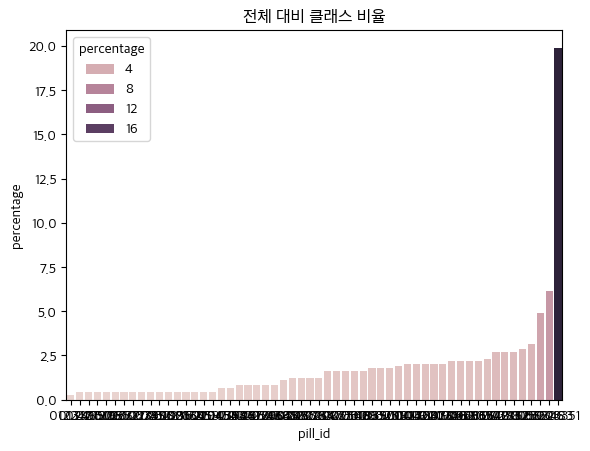

In [ ]:
# 클래스 구성 비율 파악
import pandas as pd
import seaborn as sns

pill_df = pd.DataFrame(columns=["pill_id", "count", "percentage"])

for key, value in pill_num_count_dict.items():
    pill_df.loc[len(pill_df)] = key, value, value/sum([len(a) for a in FULL_DICT.values()]) * 100

pill_df = pill_df.sort_values("count")

sns.barplot(pill_df, x="pill_id", y="percentage", hue="percentage")
plt.title("전체 대비 클래스 비율")
plt.show()

In [51]:
pill_df

,pill_id,count,percentage
40,012247,2,0.272480
27,013395,3,0.408719
37,024850,3,0.408719
33,027926,3,0.408719
32,012081,3,0.408719
30,019552,3,0.408719
29,027777,3,0.408719
49,033208,3,0.408719
54,003743,3,0.408719
26,027993,3,0.408719


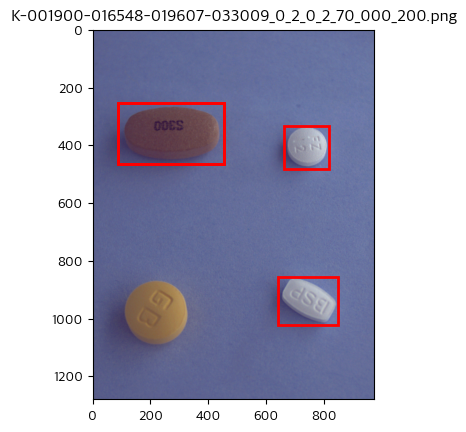

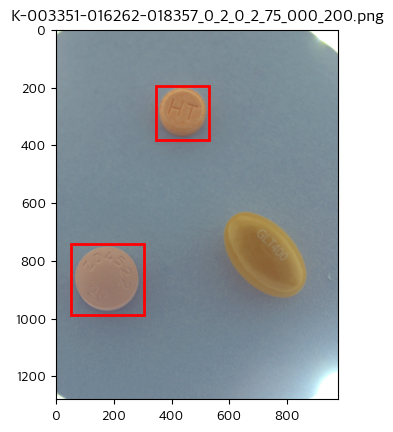

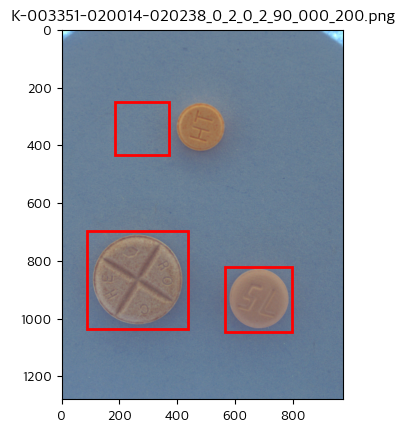

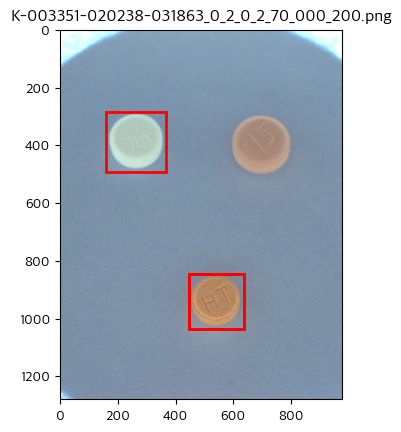

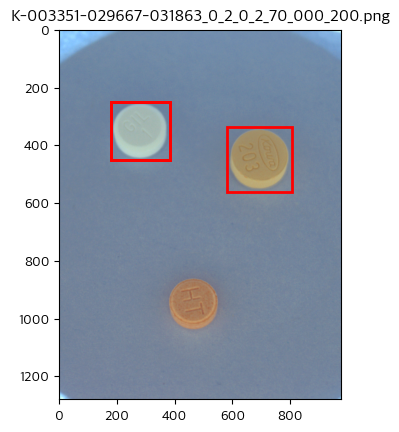

In [52]:
# 에러 이미지 출력

import torchvision
import matplotlib.patches as patches
import json

with open(err_txt_path, "r", encoding="utf-8") as f:
    err_image_paths = f.read().split()

for img in err_image_paths:
    sample_bbox = []

    for annot_path in FULL_DICT[img]:
        with open(os.path.join(ANNOT_DIR, annot_path), 'r', encoding='utf-8') as f:
            json_data = json.load(f)
            
        sample_bbox.append({
                        "bbox": json_data["annotations"][0]["bbox"],
                        "label": json_data["images"][0]["drug_N"]
                        })

    image = torchvision.io.read_image(os.path.join(IMAGE_DIR, img)).permute(1,2,0)

    fig, ax = plt.subplots()

    plt.title(f"{img}")
    plt.imshow(image)

    for bbox_dict in sample_bbox:
        x, y, w, h = bbox_dict["bbox"][0], bbox_dict["bbox"][1], bbox_dict["bbox"][2], bbox_dict["bbox"][3]
        rectangle = patches.Rectangle((x, y), w, h, color="red", fill=False, linewidth=2)
        ax.add_patch(rectangle)

    plt.show()

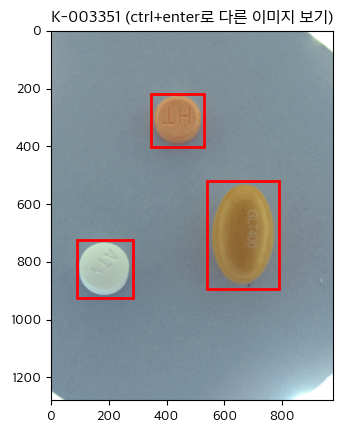

In [53]:
# 랜덤 샘플 이미지 출력

import matplotlib.patches as patches
import random

rand_idx = random.randint(1, len(FULL_DICT))

sample_image_path = list(FULL_DICT.keys())[rand_idx-1]

sample_bbox = []

for annot_path in FULL_DICT[sample_image_path]:
    with open(os.path.join(ANNOT_DIR, annot_path), 'r', encoding='utf-8') as f:
        json_data = json.load(f)
    sample_bbox.append({
                    "bbox": json_data["annotations"][0]["bbox"],
                    "label": json_data["images"][0]["drug_N"]
                    })

image = torchvision.io.read_image(os.path.join(IMAGE_DIR, sample_image_path)).permute(1,2,0)

fig, ax = plt.subplots()

plt.title(f"{sample_bbox[0]['label']} (ctrl+enter로 다른 이미지 보기)")
plt.imshow(image)

for bbox_dict in sample_bbox:
    x, y, w, h = bbox_dict["bbox"][0], bbox_dict["bbox"][1], bbox_dict["bbox"][2], bbox_dict["bbox"][3]
    rectangle = patches.Rectangle((x, y), w, h, color="red", fill=False, linewidth=2)
    ax.add_patch(rectangle)

plt.show()

In [54]:
jsons = glob.glob(os.path.join(ANNOT_DIR, "*"))
json_list = []

for folder in jsons:
    sub_folders = glob.glob(os.path.join(folder, "*"))
    for sub_folder in sub_folders:
        json_list.extend(glob.glob(os.path.join(sub_folder, "*")))

In [77]:
unique_dict = {}
err_set = set()

for json_file in json_list:
    with open(json_file, "r", encoding="utf-8") as f:
        json_opened = json.load(f)

    id = json_opened["categories"][0]["id"]
    bbox = json_opened["annotations"][0]["bbox"]
    file_name = json_opened["images"][0]["file_name"]

    try:
        if id not in unique_dict.keys():
            torchvision.io.read_image(os.path.join(IMAGE_DIR, file_name))
            unique_dict[id] = [file_name, bbox]
            
            try:
                err_set.remove(id)
            except:
                pass

    except:
        err_set.add(id)

print(f"· 이미지 누락 클래스: {len(err_set)}개")

· 이미지 누락 클래스: 0개


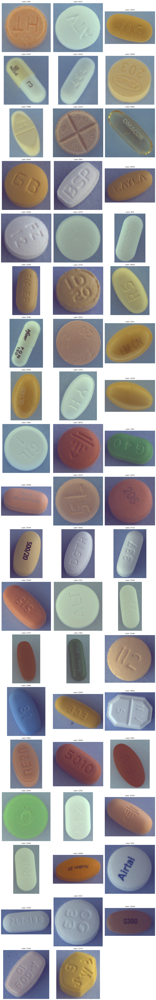

In [78]:
# 1. 전체 행(Row) 개수 계산
total_items = len(unique_dict)
ncols = 3
nrows = (total_items + ncols - 1) // ncols  # 올림 계산

# 2. 서브플롯 생성
fig, axes = plt.subplots(nrows, ncols, figsize=(15, 5 * nrows), squeeze=False)

# 딕셔너리를 리스트로 변환 (인덱싱을 위해)
items = list(unique_dict.items())

# 3. 반복문으로 axes.flat(그리드 칸)과 데이터 매칭
for i, ax in enumerate(axes.flat):
    if i < total_items:
        key, value = items[i]
        
        file_name = value[0]
        file_path = os.path.join(IMAGE_DIR, file_name)
        
        # bbox 좌표 (x, y, w, h)
        x, y, w, h = value[1]
        
        try:
            # 이미지 로드 (Tensor: C, H, W) -> permute -> (H, W, C)
            image_tensor = torchvision.io.read_image(file_path).permute(1, 2, 0)
            
            # 텐서 슬라이싱 (이미지 크롭)
            # 텐서는 정수 인덱싱이 필요하므로 int() 변환
            cropped_image = image_tensor[int(y):int(y+h), int(x):int(x+w)]
            
            # 출력
            ax.imshow(cropped_image)
            ax.set_title(f"Label: {key}")
            ax.axis('off')
            
        except Exception as e:
            # 파일이 없거나 에러 발생 시 빈 칸에 에러 메시지 표시
            ax.text(0.5, 0.5, f"Error:\n{key}", ha='center', va='center')
            ax.axis('off')
            print(f"Error processing {key}: {e}")
            
    else:
        # 남는 빈 칸 숨기기
        ax.axis('off')

plt.tight_layout()
plt.show()